In [22]:
import pandas as pd

# Load dataset
df = pd.read_csv('MC_3005_classifications.csv')

# To show the 1st 5 rows
print(df.head())

# To check basic info
print(df.info())

  River Basin District                     Management Catchment  \
0               Severn  Avon Bristol and Somerset North Streams   
1               Severn  Avon Bristol and Somerset North Streams   
2               Severn  Avon Bristol and Somerset North Streams   
3               Severn  Avon Bristol and Somerset North Streams   
4               Severn  Avon Bristol and Somerset North Streams   

  Operational Catchment   Water Body ID  \
0    Avon Bristol Rural  GB109053022230   
1    Avon Bristol Rural  GB109053022050   
2    Avon Bristol Rural  GB109053027700   
3    Avon Bristol Rural  GB109053027440   
4    Avon Bristol Rural  GB109053027610   

                                         Water Body Water Body Type  Easting  \
0         Kilmersdon Str - source to conf Snails Bk           River   369278   
1                 Marden - source to conf Cowage Bk           River   400914   
2  Sutton Benger Bk - source to conf R Avon (Brist)           River   393316   
3   Avon (Brist) c

In [24]:
print(df.describe())

# To check for missing values
print("\nMissing values per column:")
print(df.isnull().sum())

             Easting       Northing          Year         Cycle    Confidence
count   30408.000000   30408.000000  30408.000000  30408.000000  17372.000000
mean   377179.883616  169452.575013   2014.994409      1.825671      0.561029
std     16379.464094   13436.858810      3.625490      0.721184      0.444577
min    337745.000000  142139.000000   2009.000000      1.000000      0.000000
25%    366123.000000  158422.000000   2013.000000      1.000000      0.000000
50%    378536.000000  170020.000000   2014.000000      2.000000      0.740000
75%    389798.000000  180238.000000   2019.000000      2.000000      1.000000
max    402312.000000  197633.000000   2022.000000      3.000000      1.000000

Missing values per column:
River Basin District                  0
Management Catchment                  0
Operational Catchment                 0
Water Body ID                         0
Water Body                            0
Water Body Type                       0
Easting                       

In [26]:
print("Columns in dataset:")
print(df.columns.tolist())

# To view unique values in the 'Status' column 
print("\nUnique values in 'Status':")
print(df['Status'].value_counts())

# To view number of unique entries for location-based features
print("\nUnique values by location-related columns:")
print("River Basin District:", df['River Basin District'].nunique())
print("Water Body:", df['Water Body'].nunique())
print("Water Body Type:", df['Water Body Type'].unique())

# To show the distribution of 'Year'
print("\nDistribution of Year:")
print(df['Year'].value_counts().sort_index())

Columns in dataset:
['River Basin District', 'Management Catchment', 'Operational Catchment', 'Water Body ID', 'Water Body', 'Water Body Type', 'Easting', 'Northing', 'Ngr', 'Hydromorphological designation', 'Year', 'Status', 'Cycle', 'Classification Level', 'Classification Item', 'Classification ID', 'Certainty', 'Confidence', 'Deterioration Type', 'Linked Reasons', 'Investigation Outcome']

Unique values in 'Status':
Status
High                           8511
Good                           7389
Moderate                       4729
Does not require assessment    3569
Supports Good                  3006
Poor                           1659
Fail                           1013
Does Not Support Good           215
Moderate or less                209
Bad                             108
Name: count, dtype: int64

Unique values by location-related columns:
River Basin District: 1
Water Body: 106
Water Body Type: ['River' 'Lake']

Distribution of Year:
Year
2009    1865
2010    1803
2011    1743

C:\Users\Mk\AppData\Local\Temp\ipykernel_15044\3491088567.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, y='Status', order=df['Status'].value_counts().index, palette='viridis')


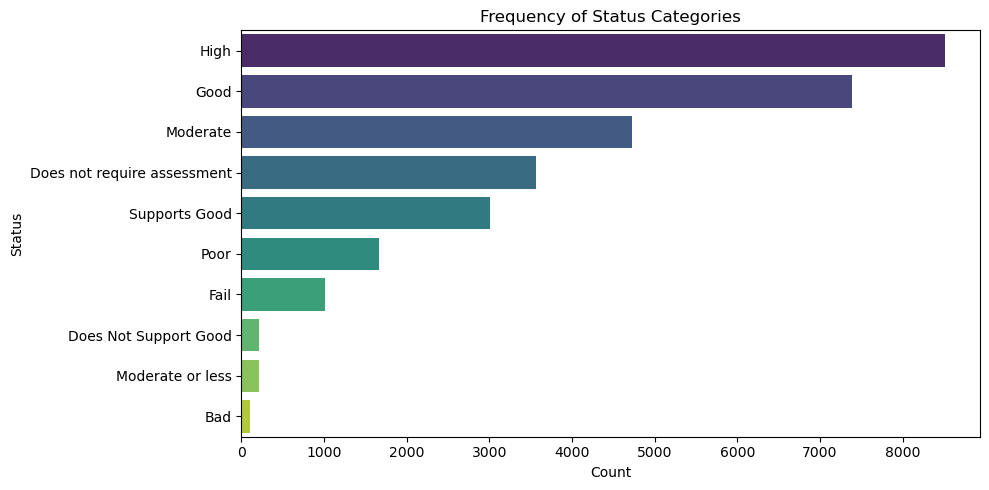

C:\Users\Mk\AppData\Local\Temp\ipykernel_15044\3491088567.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Water Body Type', palette='pastel')


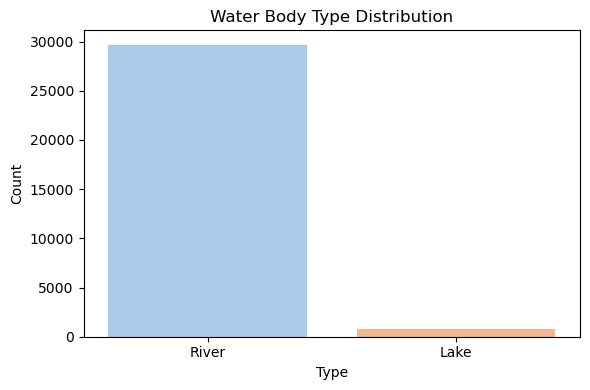

C:\Users\Mk\AppData\Local\Temp\ipykernel_15044\3491088567.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Year', palette='cubehelix')


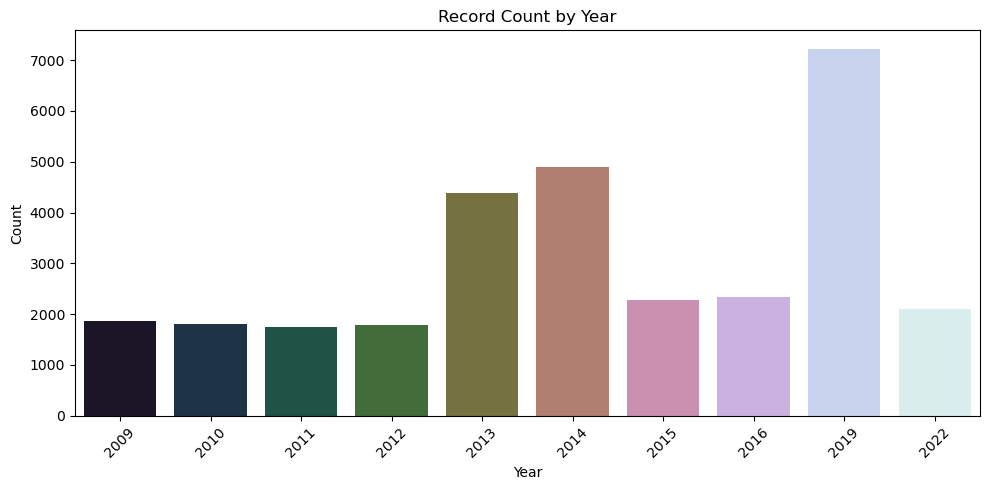

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. For 'Status' Distribution
plt.figure(figsize=(10, 5))
sns.countplot(data=df, y='Status', order=df['Status'].value_counts().index, palette='viridis')
plt.title("Frequency of Status Categories")
plt.xlabel("Count")
plt.ylabel("Status")
plt.tight_layout()
plt.show()

# 2. For Water Body Type
plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='Water Body Type', palette='pastel')
plt.title("Water Body Type Distribution")
plt.xlabel("Type")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

# 3. For Yearly trend
plt.figure(figsize=(10, 5))
sns.countplot(data=df, x='Year', palette='cubehelix')
plt.title("Record Count by Year")
plt.xlabel("Year")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

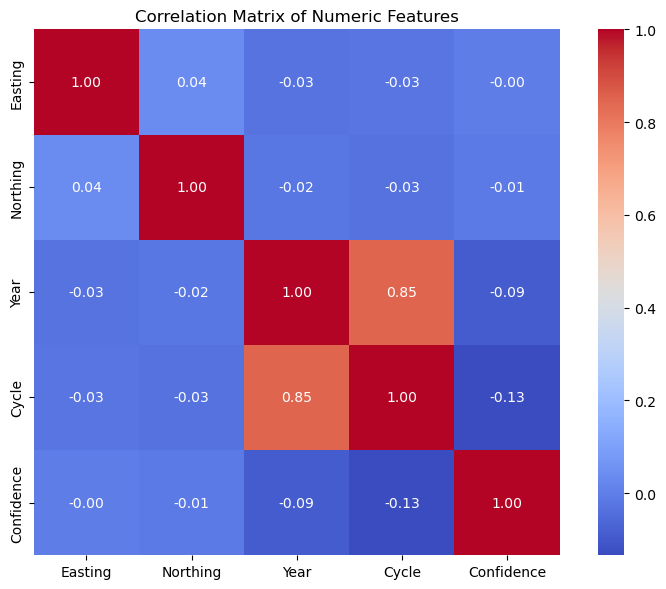

In [32]:
# To select only numeric columns
numeric_df = df.select_dtypes(include=['int64', 'float64'])

corr_matrix = numeric_df.corr()

# To plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Correlation Matrix of Numeric Features")
plt.tight_layout()
plt.show()

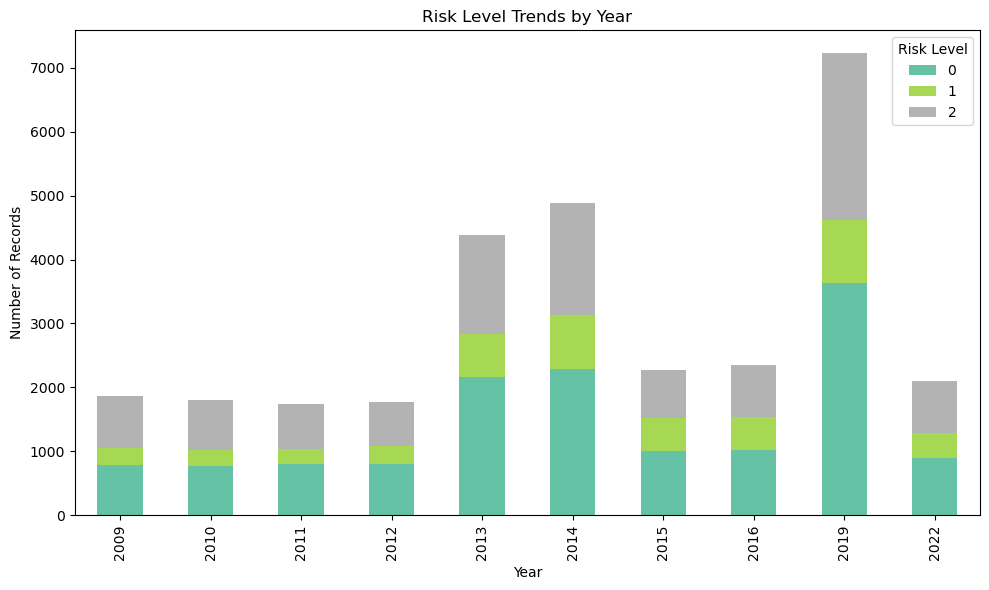

In [34]:
# Defining risk mapping from status
risk_mapping = {
    'High': 2, 'Poor': 2, 'Fail': 2, 'Bad': 2,
    'Moderate': 1, 'Moderate or less': 1,
    'Good': 0, 'Supports Good': 0, 'Does Not Support Good': 0,
    'Does not require assessment': 0
}

# Apply mapping to create risk_level
df['risk_level'] = df['Status'].map(risk_mapping)

# To ensure risk_level and Year exist and are valid
if 'risk_level' in df.columns and 'Year' in df.columns:
    risk_trend = df.groupby(['Year', 'risk_level']).size().unstack(fill_value=0)

    risk_trend.plot(kind='bar', stacked=True, colormap='Set2', figsize=(10, 6))
    plt.title("Risk Level Trends by Year")
    plt.xlabel("Year")
    plt.ylabel("Number of Records")
    plt.legend(title="Risk Level")
    plt.tight_layout()
    plt.show()
else:
    print("Required columns not found.")

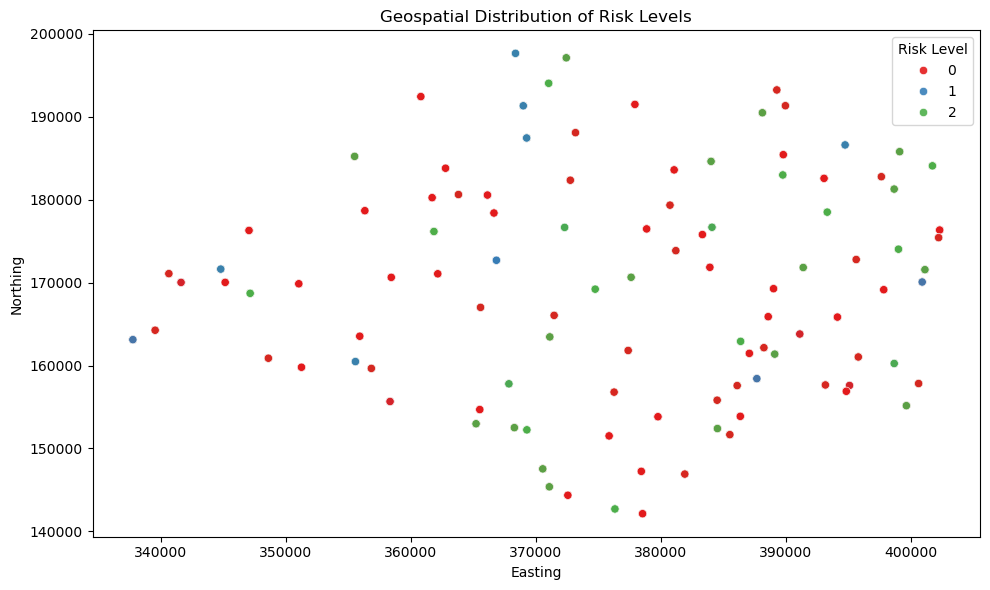

In [36]:
# categorical color palette
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df,
    x='Easting',
    y='Northing',
    hue='risk_level',
    palette='Set1',  # Qualitative palette with distinct colors
    alpha=0.9
)
plt.title('Geospatial Distribution of Risk Levels')
plt.xlabel('Easting')
plt.ylabel('Northing')
plt.legend(title='Risk Level')
plt.tight_layout()
plt.show()

In [38]:
# To select relevant features and the label
selected_columns = [
    'Easting', 'Northing', 'Year',
    'Water Body Type', 'Hydromorphological designation',
    'Classification Level', 'Classification Item',
    'Certainty', 'Confidence', 'risk_level'
]

df_model = df[selected_columns].dropna()

# One-hot encode categorical variables
df_model_encoded = pd.get_dummies(df_model, drop_first=True)

# To split features and labels
X = df_model_encoded.drop('risk_level', axis=1)
y = df_model_encoded['risk_level']

print("Features shape:", X.shape)
print("Labels shape:", y.shape)

Features shape: (17372, 107)
Labels shape: (17372,)


In [40]:
X_encoded = pd.get_dummies(X, drop_first=True)

In [66]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

full_data = X_encoded.copy()
full_data['risk_level'] = y  

X_train, X_test, y_train, y_test = train_test_split(
    full_data.drop(columns=['risk_level']),
    full_data['risk_level'],
    test_size=0.2,
    random_state=42
)

# Training Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"\nAccuracy: {accuracy_score(y_test, y_pred):.4f}")

Confusion Matrix:
[[1284    1   16]
 [   3  411   26]
 [  23   27 1684]]

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1301
           1       0.94      0.93      0.94       440
           2       0.98      0.97      0.97      1734

    accuracy                           0.97      3475
   macro avg       0.96      0.96      0.96      3475
weighted avg       0.97      0.97      0.97      3475


Accuracy: 0.9724


In [68]:
import joblib

# Saving the Random Forest model as model.pkl
model = rf_model
joblib.dump(model, 'model.pkl')

['model.pkl']

In [70]:
sample = X_test.sample(5, random_state=42)
predictions = rf_model.predict(sample)

for i in range(len(sample)):
    actual_index = sample.index[i]
    actual_value = y_test[actual_index] 
    print(f"\nSample {i+1}")
    print("Input Features:")
    print(sample.iloc[i])
    print(f"Predicted Risk Level: {predictions[i]}")
    print(f"Actual Risk Level: {actual_value}")


Sample 1
Input Features:
Easting                                393167
Northing                               157659
Year                                     2019
Confidence                                1.0
Water Body Type_River                    True
                                        ...  
Classification Item_pH                  False
Classification Item_para - para DDT     False
Certainty_Quite Certain                 False
Certainty_Uncertain                     False
Certainty_Very Certain                  False
Name: 1850, Length: 107, dtype: object
Predicted Risk Level: 2
Actual Risk Level: 2

Sample 2
Input Features:
Easting                                389280
Northing                               193221
Year                                     2014
Confidence                                0.0
Water Body Type_River                    True
                                        ...  
Classification Item_pH                  False
Classification Item_para - para DDT 

In [72]:
y_pred = rf_model.predict(X_test)

# To find indices where the model got it wrong
misclassified_indices = y_test[y_test != y_pred].index

# To extract those rows
misclassified_samples = X_test.loc[misclassified_indices]
misclassified_true = y_test.loc[misclassified_indices]
misclassified_preds = pd.Series(y_pred, index=X_test.index).loc[misclassified_indices]

# This to show 5 misclassified cases
for i in range(min(5, len(misclassified_samples))):
    idx = misclassified_samples.index[i]
    print(f"\nMisclassified Sample {i+1}")
    print("Input Features:")
    print(misclassified_samples.iloc[i])
    print(f"Predicted Risk Level: {misclassified_preds[idx]}")
    print(f"Actual Risk Level: {misclassified_true[idx]}")


Misclassified Sample 1
Input Features:
Easting                                341601
Northing                               170020
Year                                     2010
Confidence                                0.3
Water Body Type_River                    True
                                        ...  
Classification Item_pH                  False
Classification Item_para - para DDT     False
Certainty_Quite Certain                  True
Certainty_Uncertain                     False
Certainty_Very Certain                  False
Name: 27917, Length: 107, dtype: object
Predicted Risk Level: 2
Actual Risk Level: 1

Misclassified Sample 2
Input Features:
Easting                                347040
Northing                               176284
Year                                     2009
Confidence                               0.37
Water Body Type_River                    True
                                        ...  
Classification Item_pH                  False
Classif

C:\Users\Mk\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


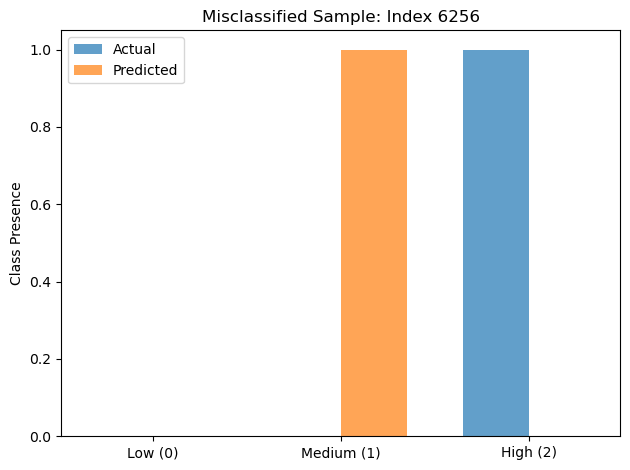

In [74]:
# misclassified sample
sample_index = 6256
sample_features = X_test.loc[sample_index]
true_label = y_test.loc[sample_index]
pred_label = rf_model.predict([sample_features])[0]

labels = ['Low (0)', 'Medium (1)', 'High (2)']
true_values = [1 if true_label == i else 0 for i in range(3)]
pred_values = [1 if pred_label == i else 0 for i in range(3)]

x = range(3)
width = 0.35

fig, ax = plt.subplots()
ax.bar(x, true_values, width, label='Actual', alpha=0.7)
ax.bar([p + width for p in x], pred_values, width, label='Predicted', alpha=0.7)

ax.set_ylabel('Class Presence')
ax.set_title(f"Misclassified Sample: Index {sample_index}")
ax.set_xticks([p + width / 2 for p in x])
ax.set_xticklabels(labels)
ax.legend()
plt.tight_layout()
plt.show()

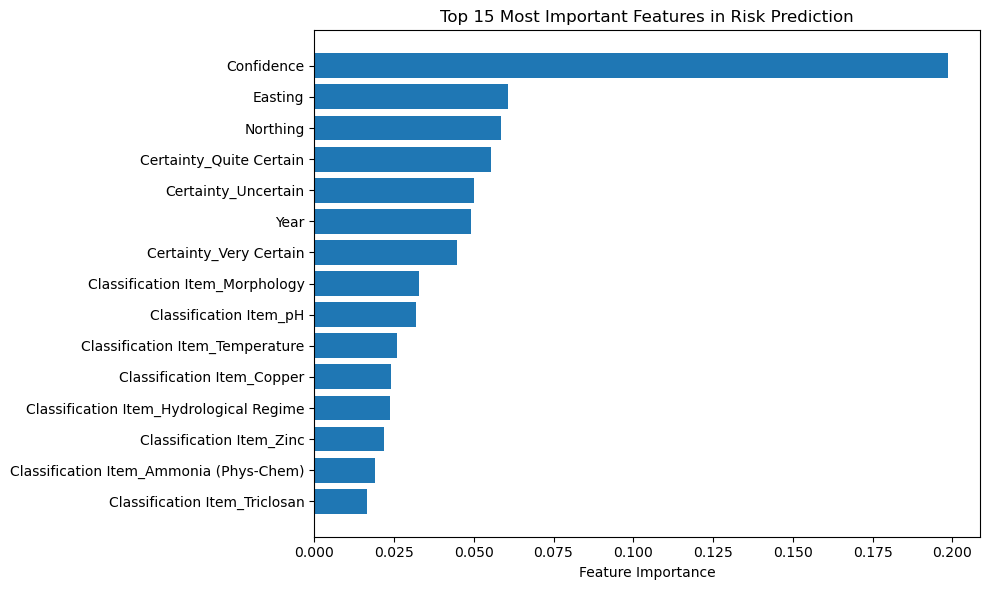

In [76]:
# To get feature importance from the trained Random Forest
importances = rf_model.feature_importances_
feature_names = X_test.columns

# Sort them
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot top 15
top_n = 15
top_features = importance_df.head(top_n)

plt.figure(figsize=(10, 6))
plt.barh(top_features['Feature'][::-1], top_features['Importance'][::-1])
plt.xlabel('Feature Importance')
plt.title(f'Top {top_n} Most Important Features in Risk Prediction')
plt.tight_layout()
plt.show()

In [78]:
importances = rf_model.feature_importances_
features = X_train.columns

# Creating a DataFrame of feature names and their importance
importance_df = pd.DataFrame({'Feature': features, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Showing the top 15 features
print(importance_df.head(15))

                                     Feature  Importance
3                                 Confidence    0.198717
0                                    Easting    0.060732
1                                   Northing    0.058425
104                  Certainty_Quite Certain    0.055521
105                      Certainty_Uncertain    0.049983
2                                       Year    0.049272
106                   Certainty_Very Certain    0.044701
69            Classification Item_Morphology    0.032723
102                   Classification Item_pH    0.031886
91           Classification Item_Temperature    0.026073
37                Classification Item_Copper    0.024077
58   Classification Item_Hydrological Regime    0.023874
101                 Classification Item_Zinc    0.021739
18   Classification Item_Ammonia (Phys-Chem)    0.019140
100            Classification Item_Triclosan    0.016658


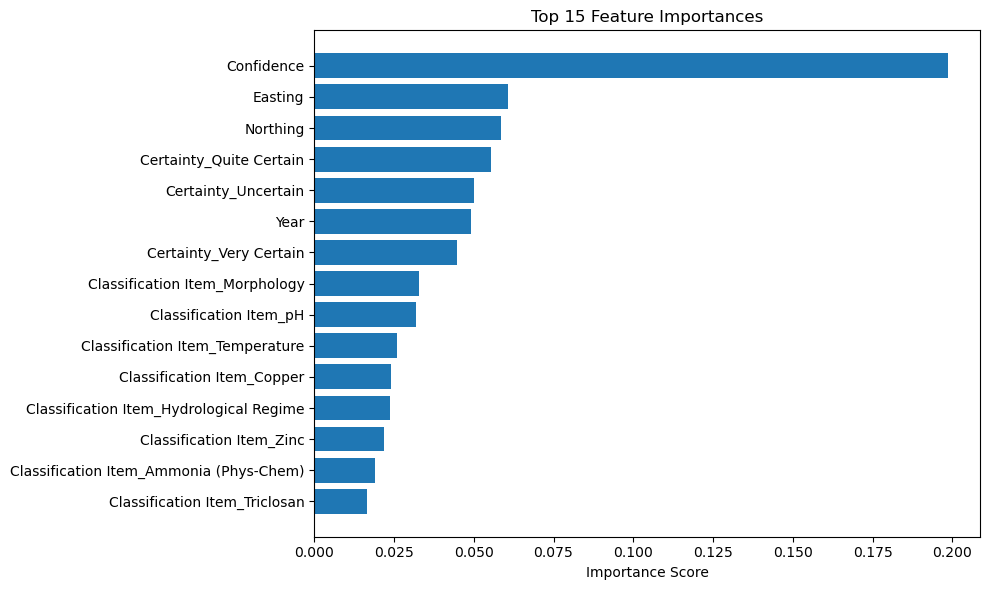

In [80]:
importances = rf_model.feature_importances_

# Creating DataFrame
importance_df = pd.DataFrame({
    'Feature': X_encoded.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'][:15], importance_df['Importance'][:15])
plt.gca().invert_yaxis()
plt.xlabel('Importance Score')
plt.title('Top 15 Feature Importances')
plt.tight_layout()
plt.show()

In [82]:
# Geting feature importances from the existing model
importances = rf_model.feature_importances_
feature_names = X_encoded.columns

# Creating a DataFrame and get top 10 features
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

top_features = importance_df['Feature'].head(10).tolist()

# To subset the dataset to use only top features
X_top = X_encoded[top_features]
y = y 

# Train/test split
X_train_top, X_test_top, y_train_top, y_test_top = train_test_split(X_top, y, test_size=0.2, random_state=42)

# Retraining the model
rf_top_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_top_model.fit(X_train_top, y_train_top)

y_pred_top = rf_top_model.predict(X_test_top)

print("Confusion Matrix:")
print(confusion_matrix(y_test_top, y_pred_top))
print("\nClassification Report:")
print(classification_report(y_test_top, y_pred_top))
print("Accuracy:", accuracy_score(y_test_top, y_pred_top))

Confusion Matrix:
[[1136    8  157]
 [  18  364   58]
 [ 238   42 1454]]

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.87      0.84      1301
           1       0.88      0.83      0.85       440
           2       0.87      0.84      0.85      1734

    accuracy                           0.85      3475
   macro avg       0.86      0.85      0.85      3475
weighted avg       0.85      0.85      0.85      3475

Accuracy: 0.8500719424460431


In [84]:
joblib.dump(rf_top_model, "model_rf_top10.pkl")

['model_rf_top10.pkl']

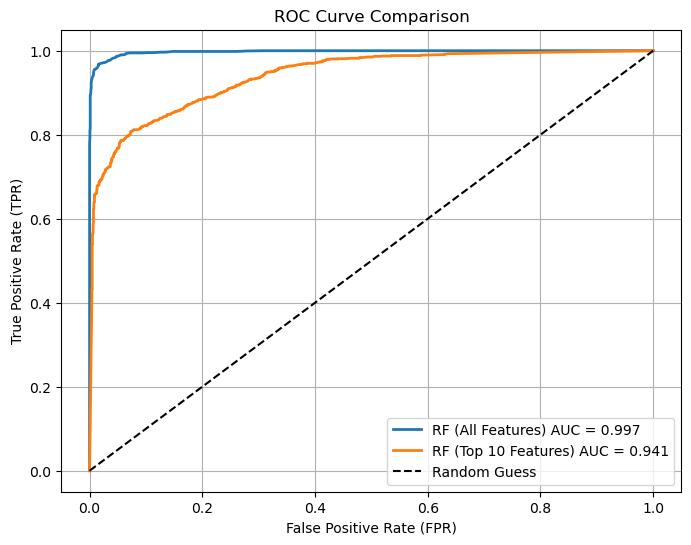

In [86]:
from sklearn.metrics import roc_curve, auc

# Loading both models
model_all = joblib.load("model.pkl")
model_top10 = joblib.load("model_rf_top10.pkl")

# Getting probability predictions for positive class (High risk = label 2)
y_score_all = model_all.predict_proba(X_test)[:, 2]  # Class index 2 for "High Risk"
y_score_top10 = model_top10.predict_proba(X_test[top_features])[:, 2]

fpr_all, tpr_all, _ = roc_curve(y_test == 2, y_score_all)
fpr_top10, tpr_top10, _ = roc_curve(y_test == 2, y_score_top10)

auc_all = auc(fpr_all, tpr_all)
auc_top10 = auc(fpr_top10, tpr_top10)

# For ROC comparison
plt.figure(figsize=(8,6))
plt.plot(fpr_all, tpr_all, label=f"RF (All Features) AUC = {auc_all:.3f}", linewidth=2)
plt.plot(fpr_top10, tpr_top10, label=f"RF (Top 10 Features) AUC = {auc_top10:.3f}", linewidth=2)

# To plot baseline
plt.plot([0,1], [0,1], 'k--', label="Random Guess")

plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("ROC Curve Comparison")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

In [88]:
# Top 15 most important features (from your plot)
top_15_features = [
    'Confidence', 'Easting', 'Northing',
    'Certainty_Quite Certain', 'Certainty_Uncertain',
    'Year', 'Certainty_Very Certain',
    'Classification Item_Morphology', 'Classification Item_pH',
    'Classification Item_Temperature', 'Classification Item_Copper',
    'Classification Item_Hydrological Regime', 'Classification Item_Zinc',
    'Classification Item_Ammonia (Phys-Chem)', 'Classification Item_Triclosan'
]

# Selecting features and target
X_top15 = X_encoded[top_15_features]
y = X_encoded.index.map(df['risk_level'])

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X_top15, y, test_size=0.2, random_state=42)

rf_model_top15 = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model_top15.fit(X_train, y_train)

y_pred = rf_model_top15.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"\nAccuracy: {accuracy_score(y_test, y_pred):.4f}")

Confusion Matrix:
[[1249    3   49]
 [  15  367   58]
 [ 107   38 1589]]

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.96      0.93      1301
           1       0.90      0.83      0.87       440
           2       0.94      0.92      0.93      1734

    accuracy                           0.92      3475
   macro avg       0.92      0.90      0.91      3475
weighted avg       0.92      0.92      0.92      3475


Accuracy: 0.9223


In [90]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Splitting data
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# training model
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

print(f"\nAccuracy: {accuracy_score(y_test, y_pred):.4f}")

C:\Users\Mk\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [19:32:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Confusion Matrix:
[[1280    1   20]
 [   5  404   31]
 [  47   19 1668]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1301
           1       0.95      0.92      0.94       440
           2       0.97      0.96      0.97      1734

    accuracy                           0.96      3475
   macro avg       0.96      0.95      0.96      3475
weighted avg       0.96      0.96      0.96      3475


Accuracy: 0.9646


In [92]:
sample_indices = [100, 500, 1000, 1500, 2000]

print("\nXGBoost Predictions:\n")

for i, idx in enumerate(sample_indices):
    sample = X_test.iloc[idx:idx+1]
    prediction = xgb_model.predict(sample)[0]  # use your actual XGBoost model variable here
    actual = y_test.iloc[idx]

    print(f"\nSample {i+1} (Index: {idx})")
    print("Input Features:")
    print(sample.squeeze())
    print(f"Predicted Risk Level: {prediction}")
    print(f"Actual Risk Level: {actual}")


XGBoost Predictions:



AttributeError: 'Index' object has no attribute 'iloc'

In [94]:
# Showing first 5 misclassified XGBoost samples like Random Forest style
for i, (idx, row) in enumerate(misclassified_xgb.head(5).iterrows(), start=1):
    print(f"\nMisclassified Sample {i} (Index: {idx})")
    print("Input Features:")
    print(row.drop(['Actual', 'Predicted']))  # Drop target columns for clarity
    print(f"Predicted Risk Level: {row['Predicted']}")
    print(f"Actual Risk Level: {row['Actual']}")

NameError: name 'misclassified_xgb' is not defined

In [46]:
# To get full sample by index
sample = misclassified_xgb.loc[10659]

input_features = sample.drop(['Actual', 'Predicted'])

# Show prediction
print("Misclassified Sample (Index: 10659)\n")
print("Actual Risk Level:", sample['Actual'])
print("Predicted Risk Level:", sample['Predicted'])
print("\nInput Features:")
print(input_features)

🔍 Misclassified Sample (Index: 10659)

🎯 Actual Risk Level: 0
❌ Predicted Risk Level: 2

📥 Input Features:
Easting                                386358
Northing                               153877
Year                                     2010
Confidence                               0.68
Water Body Type_River                    True
                                        ...  
Classification Item_pH                  False
Classification Item_para - para DDT     False
Certainty_Quite Certain                 False
Certainty_Uncertain                     False
Certainty_Very Certain                  False
Name: 10659, Length: 107, dtype: object


In [24]:
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Train CatBoost
model = CatBoostClassifier(verbose=0, random_state=42)
model.fit(X_train, y_train)

# Predict
y_pred = model.predict(X_test)

# Evaluate
print("📊 Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\n📋 Classification Report:")
print(classification_report(y_test, y_pred))

print(f"\n✅ Accuracy: {accuracy_score(y_test, y_pred):.4f}")

📊 Confusion Matrix:
[[1275    2   24]
 [   5  410   25]
 [  27   27 1680]]

📋 Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1301
           1       0.93      0.93      0.93       440
           2       0.97      0.97      0.97      1734

    accuracy                           0.97      3475
   macro avg       0.96      0.96      0.96      3475
weighted avg       0.97      0.97      0.97      3475


✅ Accuracy: 0.9683


In [30]:
# Sample indices to test
sample_indices = [100, 500, 1000, 1500, 2000]

print("🔍 CatBoost Predictions:\n")

for i, idx in enumerate(sample_indices):
    sample = X_test.iloc[idx:idx+1]
    prediction = model.predict(sample)[0]  # 'model' is your CatBoost model
    actual = y_test.iloc[idx]

    print(f"\nSample {i+1} (Index: {idx})")
    print("Input Features:")
    print(sample.squeeze())
    print(f"✅ Predicted Risk Level: {prediction}")
    print(f"🎯 Actual Risk Level: {actual}")

🔍 CatBoost Predictions:


Sample 1 (Index: 100)
Input Features:
Easting                                387082
Northing                               161466
Year                                     2013
Confidence                                0.0
Water Body Type_River                    True
                                        ...  
Classification Item_pH                  False
Classification Item_para - para DDT     False
Certainty_Quite Certain                 False
Certainty_Uncertain                     False
Certainty_Very Certain                  False
Name: 22875, Length: 107, dtype: object
✅ Predicted Risk Level: [0]
🎯 Actual Risk Level: 0

Sample 2 (Index: 500)
Input Features:
Easting                                389967
Northing                               191321
Year                                     2010
Confidence                               0.89
Water Body Type_River                    True
                                        ...  
Classification Item_pH  

In [50]:
# Make sure CatBoost model is already trained (named `model`)
cat_preds = model.predict(X_test)

# Display first 5 misclassified CatBoost samples like Random Forest style
for i, (idx, row) in enumerate(misclassified_cat.head(5).iterrows(), start=1):
    print(f"\n🔍 Misclassified Sample {i} (Index: {idx})")
    print("Input Features:")
    print(row.drop(['Actual', 'Predicted']))  # Drop target columns for clarity
    print(f"✅ Predicted Risk Level: {row['Predicted']}")
    print(f"🎯 Actual Risk Level: {row['Actual']}")


🔍 Misclassified Sample 1 (Index: 27917)
Input Features:
Easting                                341601
Northing                               170020
Year                                     2010
Confidence                                0.3
Water Body Type_River                    True
                                        ...  
Classification Item_pH                  False
Classification Item_para - para DDT     False
Certainty_Quite Certain                  True
Certainty_Uncertain                     False
Certainty_Very Certain                  False
Name: 27917, Length: 107, dtype: object
✅ Predicted Risk Level: 2
🎯 Actual Risk Level: 1

🔍 Misclassified Sample 2 (Index: 30291)
Input Features:
Easting                                347040
Northing                               176284
Year                                     2009
Confidence                               0.37
Water Body Type_River                    True
                                        ...  
Classification 

C:\Users\Mk\AppData\Local\Temp\ipykernel_712\2055351118.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=importance_df, x='Importance', y='Feature', palette='Blues_d')


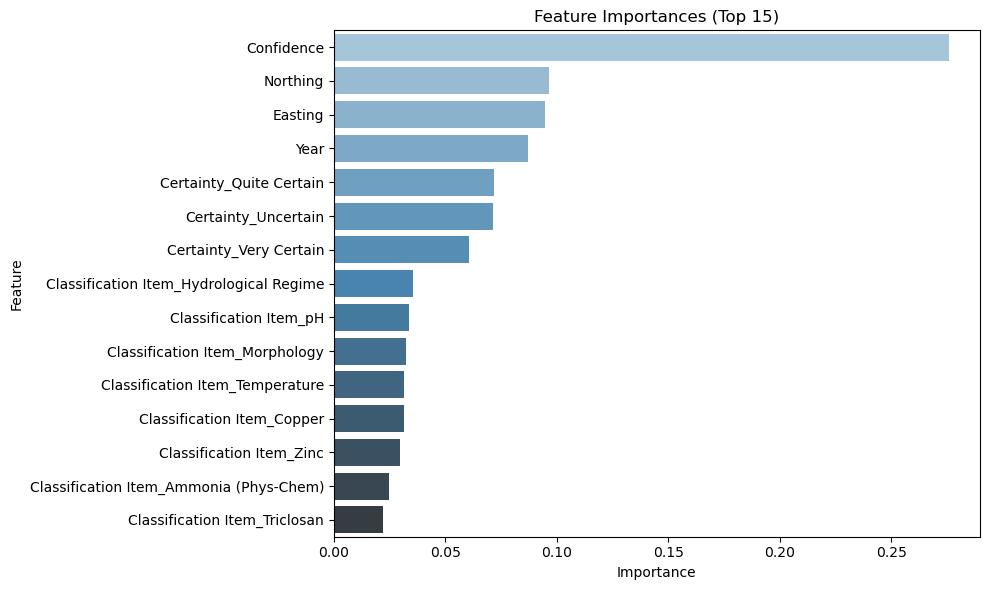

In [36]:
# Get feature importances from the current model
importances = rf_model_top15.feature_importances_

# Create DataFrame for plotting
importance_df = pd.DataFrame({
    'Feature': top_15_features,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=importance_df, x='Importance', y='Feature', palette='Blues_d')
plt.title('Feature Importances (Top 15)')
plt.tight_layout()
plt.show()

In [42]:
import joblib

# Save the top-15 feature model
joblib.dump(rf_model_top15, 'flood_risk_rf_top15_model.pkl')

['flood_risk_rf_top15_model.pkl']

In [207]:
df.columns

Index(['River Basin District', 'Management Catchment', 'Operational Catchment',
       'Water Body ID', 'Water Body', 'Water Body Type', 'Easting', 'Northing',
       'Ngr', 'Hydromorphological designation', 'Year', 'Status', 'Cycle',
       'Classification Level', 'Classification Item', 'Classification ID',
       'Certainty', 'Confidence', 'Deterioration Type', 'Linked Reasons',
       'Investigation Outcome', 'risk_level'],
      dtype='object')

In [209]:
df.groupby('Water Body')['Year'].nunique().sort_values(ascending=False)

Water Body
Abberd Bk - source to conf R Marden                   10
Oldbury Naite Rhine                                   10
Semington Brook (Worton Str to Milebourne Str         10
Semington Bk-Milebourne Str to conf R Avon (Brist)    10
Semington Bk - source to conf Worton Str              10
                                                      ..
Frome (Maiden Bradley to Mells)                        6
Kenn Moor SSSI                                         6
Chew - source to Chew Valley Lake                      4
Luckington Bk                                          4
Chew - Chew Valley Lake to conf Winford Brook          4
Name: Year, Length: 106, dtype: int64

In [211]:
df_highest_risk = df.sort_values('risk_level', ascending=False).drop_duplicates('Water Body')

In [195]:
import pyproj

# Assuming df contains 'Easting' and 'Northing'
df_geo = df.copy()

# Define transformer (British National Grid to WGS84)
transformer = pyproj.Transformer.from_crs("epsg:27700", "epsg:4326", always_xy=True)

# Apply transformation
df_geo['Longitude'], df_geo['Latitude'] = transformer.transform(df_geo['Easting'].values, df_geo['Northing'].values)

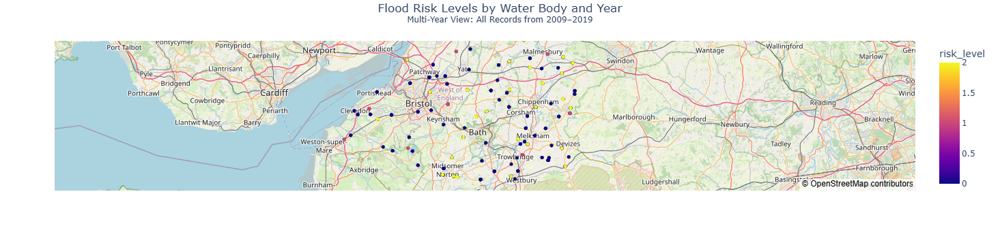

In [217]:
import plotly.express as px

fig = px.scatter_mapbox(
    df_geo,
    lat='Latitude',
    lon='Longitude',
    color='risk_level',
    hover_name='Water Body',
    hover_data=['Status', 'Year'],
    mapbox_style='open-street-map',
    zoom=8,
    height=600
)

fig.update_layout(
    title={
        'text': "Flood Risk Levels by Water Body and Year<br><sup>Multi-Year View: All Records from 2009–2019</sup>",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)

fig.show()

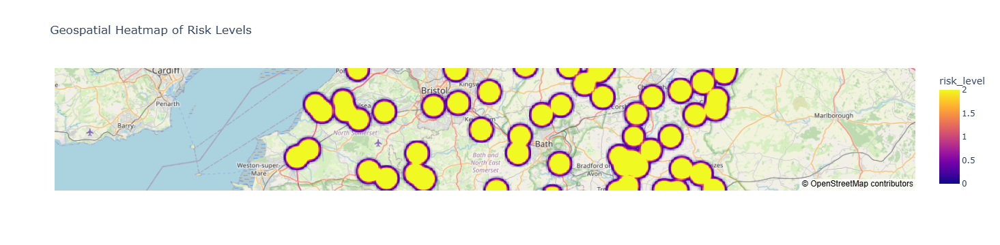

In [199]:
import plotly.express as px

# Make sure Latitude, Longitude, and risk_level exist in your DataFrame (df_geo)
fig = px.density_mapbox(
    df_geo,
    lat='Latitude',
    lon='Longitude',
    z='risk_level',  # This weights the density by risk level (0, 1, 2)
    radius=15,       # Adjust for more/less smoothing
    center=dict(lat=df_geo['Latitude'].mean(), lon=df_geo['Longitude'].mean()),
    zoom=8,
    height=600,
    mapbox_style='open-street-map',
    title="Geospatial Heatmap of Risk Levels"
)

fig.show()

In [213]:
# Sort by risk_level so the highest value comes first
df_sorted = df.sort_values('risk_level', ascending=False)

# Drop duplicates to keep the highest risk_level for each Water Body
df_highest_risk = df_sorted.drop_duplicates(subset='Water Body')

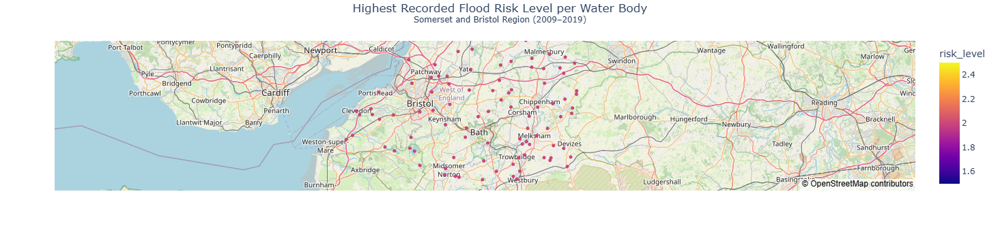

In [215]:
import pyproj
import plotly.express as px

# Step 1: Transform coordinates if not already done
df_highest_risk = df.sort_values('risk_level', ascending=False).drop_duplicates(subset='Water Body')

transformer = pyproj.Transformer.from_crs("epsg:27700", "epsg:4326", always_xy=True)
df_highest_risk['Longitude'], df_highest_risk['Latitude'] = transformer.transform(
    df_highest_risk['Easting'].values,
    df_highest_risk['Northing'].values
)

# Step 2: Plot the highest risk per Water Body
fig = px.scatter_mapbox(
    df_highest_risk,
    lat='Latitude',
    lon='Longitude',
    color='risk_level',
    hover_name='Water Body',
    hover_data=['Status', 'Year'],
    mapbox_style='open-street-map',
    zoom=8,
    height=650
)

# Step 3: Update layout to add title + subtitle
fig.update_layout(
    title={
        'text': "Highest Recorded Flood Risk Level per Water Body<br><sup>Somerset and Bristol Region (2009–2019)</sup>",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)

fig.show()

In [225]:
df['risk_level'].value_counts()

risk_level
0    14179
2    11291
1     4938
Name: count, dtype: int64

In [229]:
df.groupby('Year')['risk_level'].value_counts().unstack().fillna(0)

risk_level,0,1,2
Year,,,
2009,789,259,817
2010,771,252,780
2011,799,238,706
2012,809,270,700
2013,2164,667,1549
2014,2292,840,1755
2015,1008,513,753
2016,1028,507,810
2019,3626,996,2604


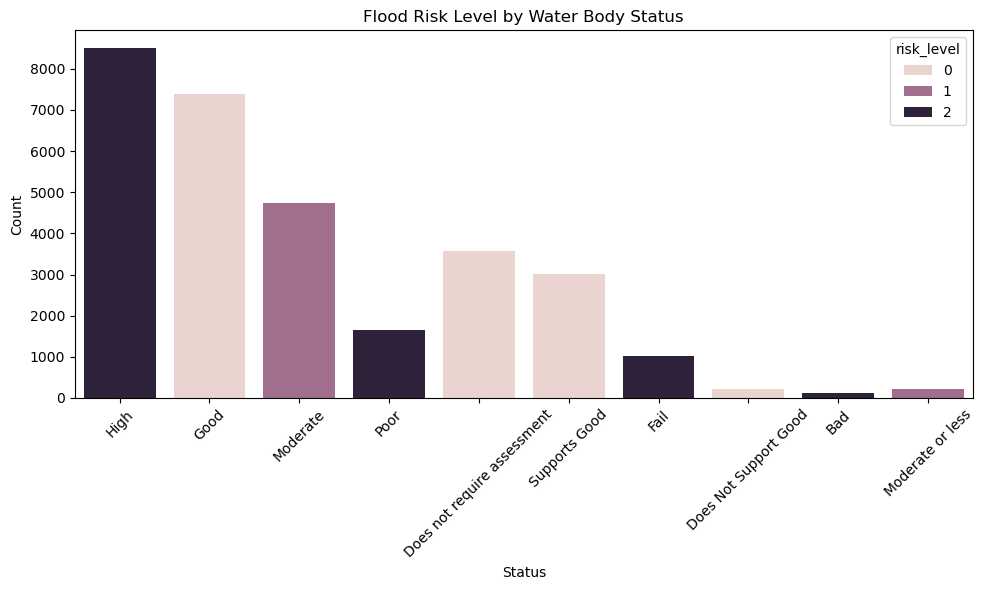

In [231]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Status', hue='risk_level')
plt.title('Flood Risk Level by Water Body Status')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

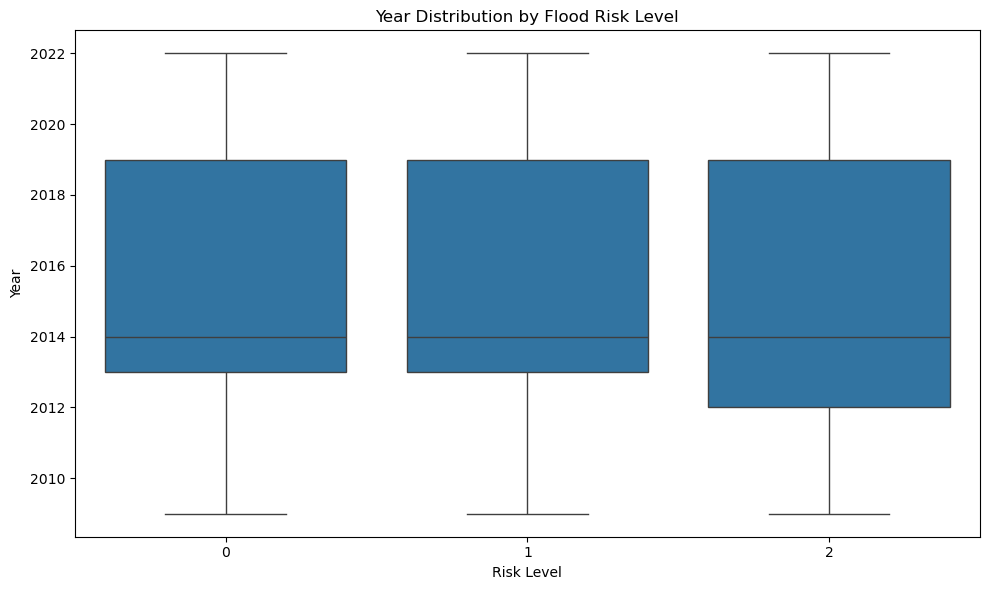

In [233]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='risk_level', y='Year')
plt.title('Year Distribution by Flood Risk Level')
plt.xlabel('Risk Level')
plt.ylabel('Year')
plt.tight_layout()
plt.show()

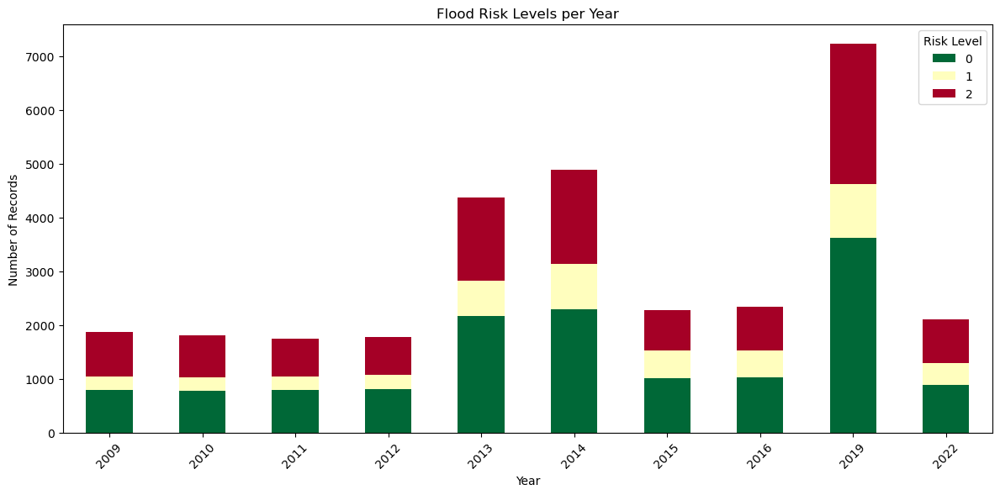

In [235]:
df_year_risk = df.groupby(['Year', 'risk_level']).size().unstack(fill_value=0)

df_year_risk.plot(kind='bar', stacked=True, figsize=(12,6), colormap='RdYlGn_r')
plt.title('Flood Risk Levels per Year')
plt.ylabel('Number of Records')
plt.xlabel('Year')
plt.xticks(rotation=45)
plt.legend(title='Risk Level')
plt.tight_layout()
plt.show()

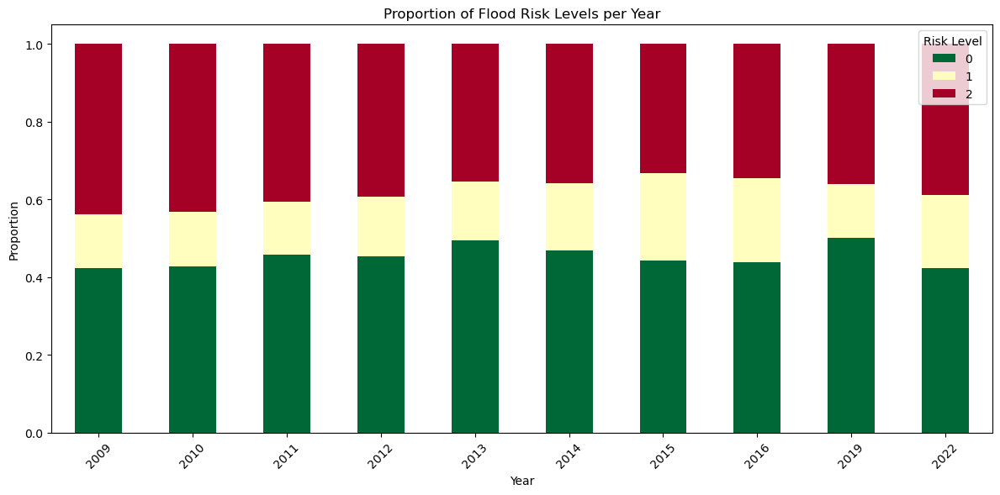

In [237]:
df_prop = df_year_risk.div(df_year_risk.sum(axis=1), axis=0)

df_prop.plot(kind='bar', stacked=True, figsize=(12,6), colormap='RdYlGn_r')
plt.title('Proportion of Flood Risk Levels per Year')
plt.ylabel('Proportion')
plt.xlabel('Year')
plt.xticks(rotation=45)
plt.legend(title='Risk Level')
plt.tight_layout()
plt.show()

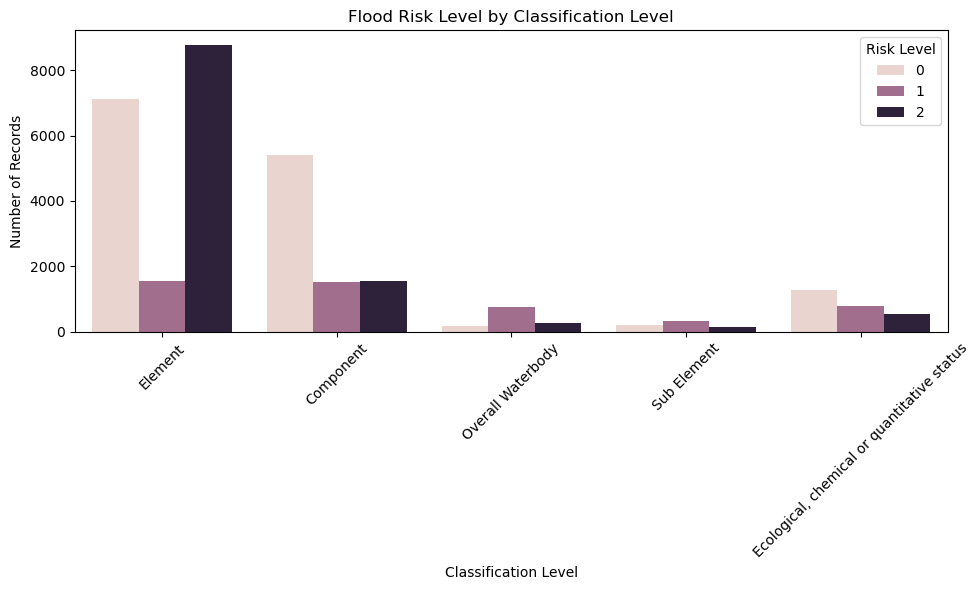

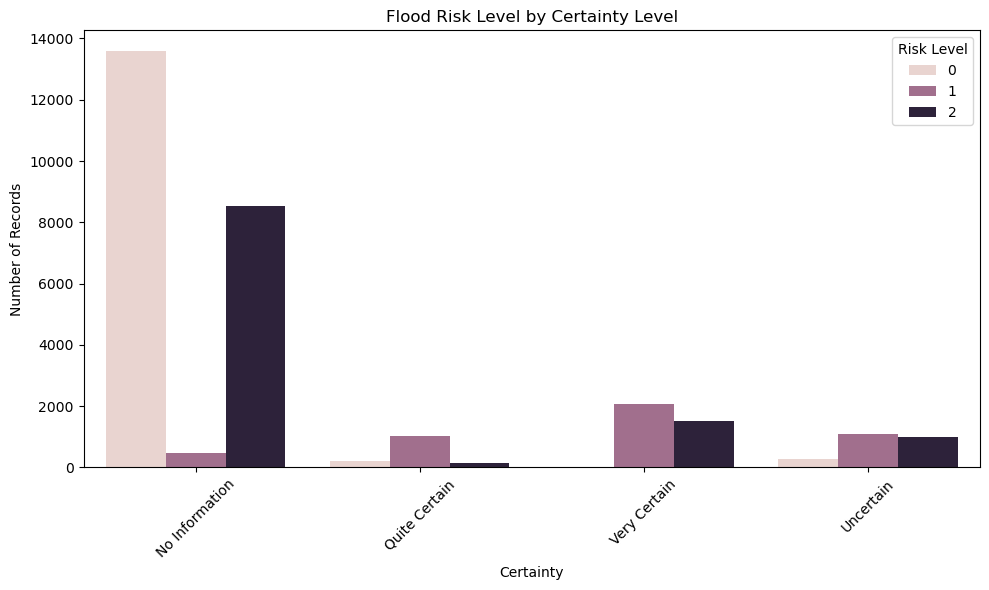

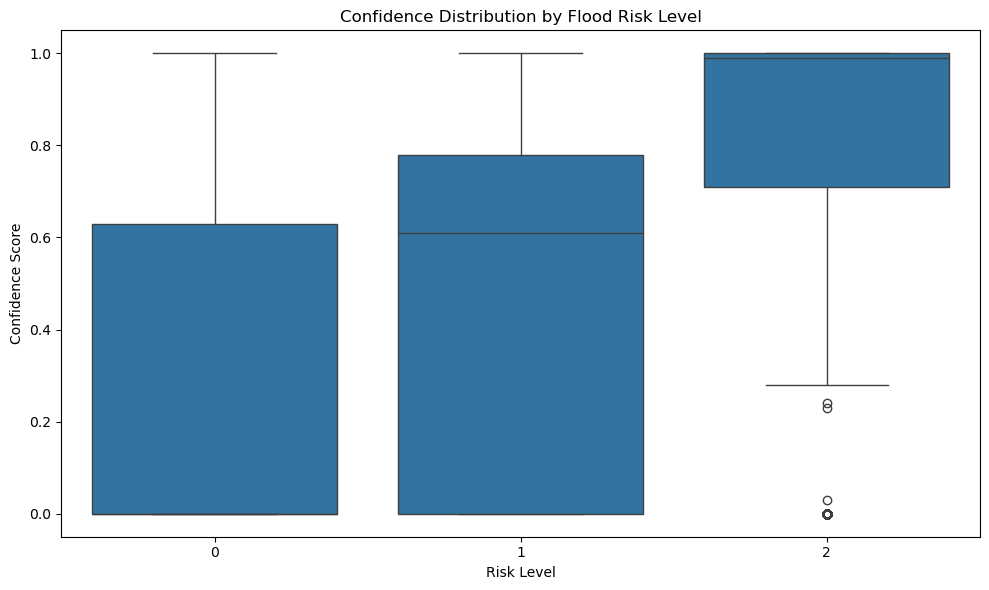

In [245]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Classification Level', hue='risk_level')
plt.title('Flood Risk Level by Classification Level')
plt.xlabel('Classification Level')
plt.ylabel('Number of Records')
plt.legend(title='Risk Level')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Certainty', hue='risk_level')
plt.title('Flood Risk Level by Certainty Level')
plt.xlabel('Certainty')
plt.ylabel('Number of Records')
plt.legend(title='Risk Level')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='risk_level', y='Confidence')
plt.title('Confidence Distribution by Flood Risk Level')
plt.xlabel('Risk Level')
plt.ylabel('Confidence Score')
plt.tight_layout()
plt.show()

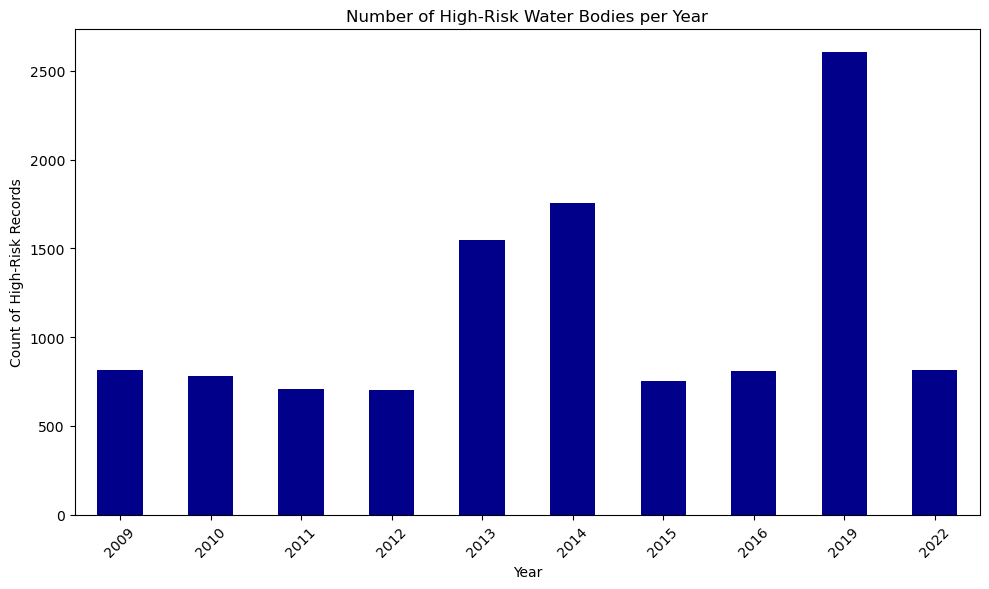

In [253]:
import matplotlib.pyplot as plt

# Filter high-risk data
high_risk = df[df['risk_level'] == 2]

# Count high-risk entries by year
high_risk_by_year = high_risk['Year'].value_counts().sort_index()

# Plot
plt.figure(figsize=(10,6))
high_risk_by_year.plot(kind='bar', color='darkblue')
plt.title('Number of High-Risk Water Bodies per Year')
plt.xlabel('Year')
plt.ylabel('Count of High-Risk Records')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

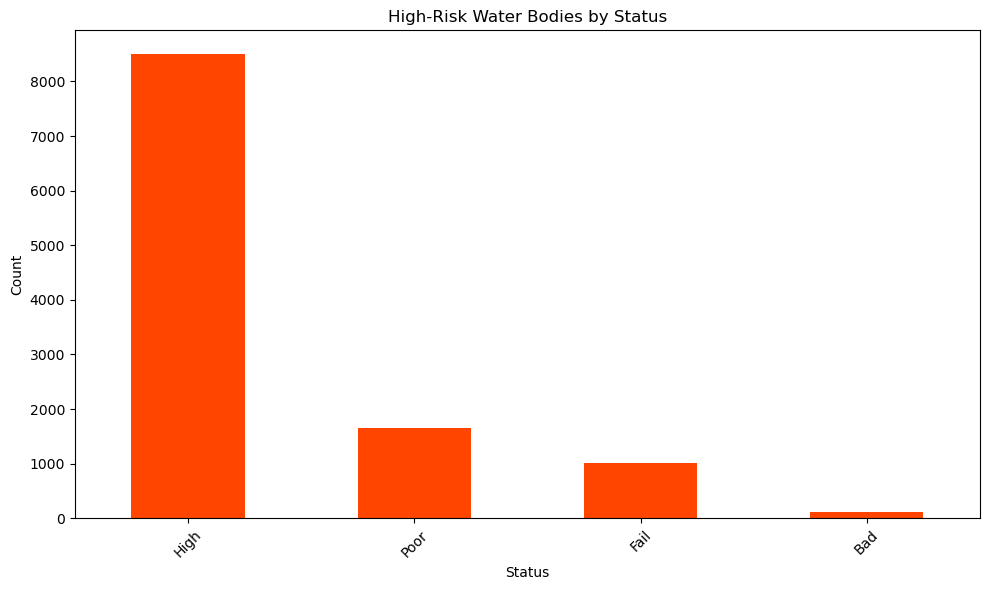

In [255]:
# Count high-risk entries by status
high_risk_by_status = high_risk['Status'].value_counts()

# Plot
plt.figure(figsize=(10,6))
high_risk_by_status.plot(kind='bar', color='orangered')
plt.title('High-Risk Water Bodies by Status')
plt.xlabel('Status')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

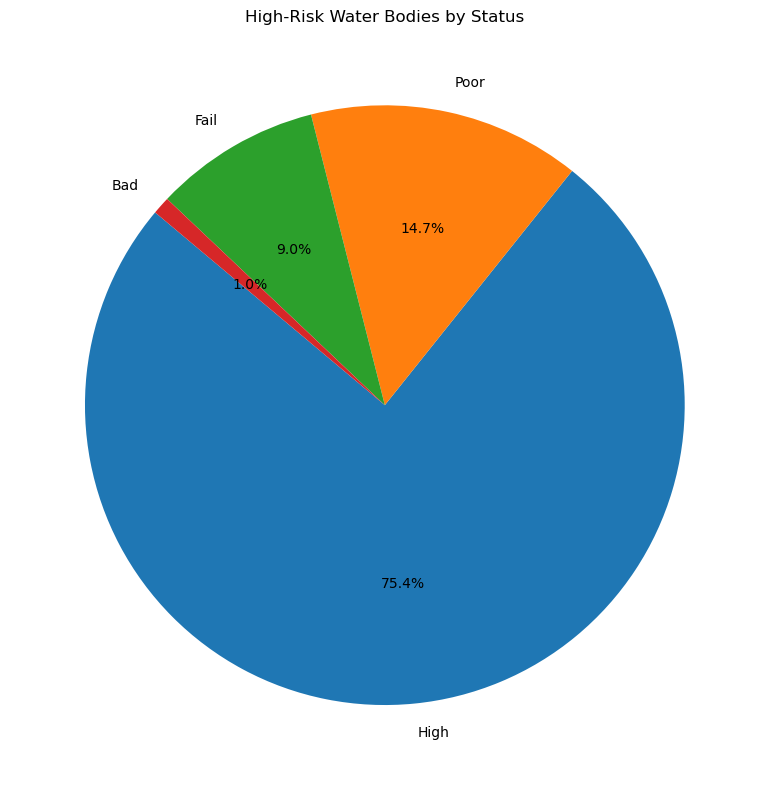

In [265]:
import matplotlib.pyplot as plt

# Filter high-risk data
high_risk = df[df['risk_level'] == 2]

# Count by Status
status_counts = high_risk['Status'].value_counts()

# Plot pie chart
plt.figure(figsize=(8, 8))
status_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140, color=(range(len(status_counts))))
plt.title('High-Risk Water Bodies by Status')
plt.ylabel('')  # Hide y-label
plt.tight_layout()
plt.show()

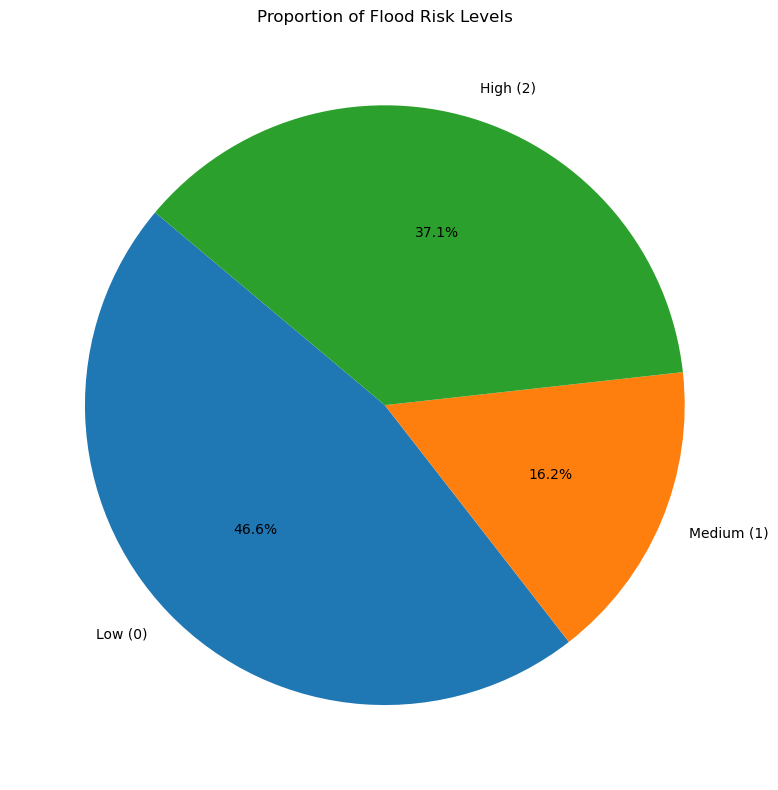

In [279]:
# Count all risk levels
risk_counts = df['risk_level'].value_counts().sort_index()

# Label mapping (optional)
labels = ['Low (0)', 'Medium (1)', 'High (2)']

# Plot
plt.figure(figsize=(8, 8))
risk_counts.plot(kind='pie', labels=labels, autopct='%1.1f%%', startangle=140, color=plt.cm.RdYlGn_r(range(3)))
plt.title('Proportion of Flood Risk Levels')
plt.ylabel('')
plt.tight_layout()
plt.show()

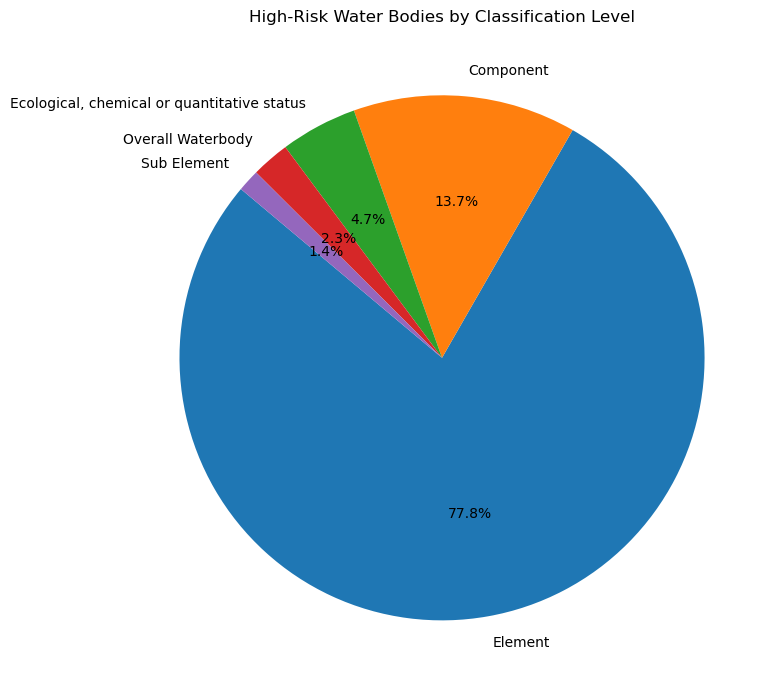

In [277]:
# Filter high-risk records
high_risk = df[df['risk_level'] == 2]

# Count by Classification Level
class_counts = high_risk['Classification Level'].value_counts()

# Plot
plt.figure(figsize=(8, 8))
class_counts.plot(
    kind='pie',
    autopct='%1.1f%%',
    startangle=140,
    color=plt.cm.Blues(range(len(class_counts)))
)
plt.title('High-Risk Water Bodies by Classification Level')
plt.ylabel('')
plt.tight_layout()
plt.show()

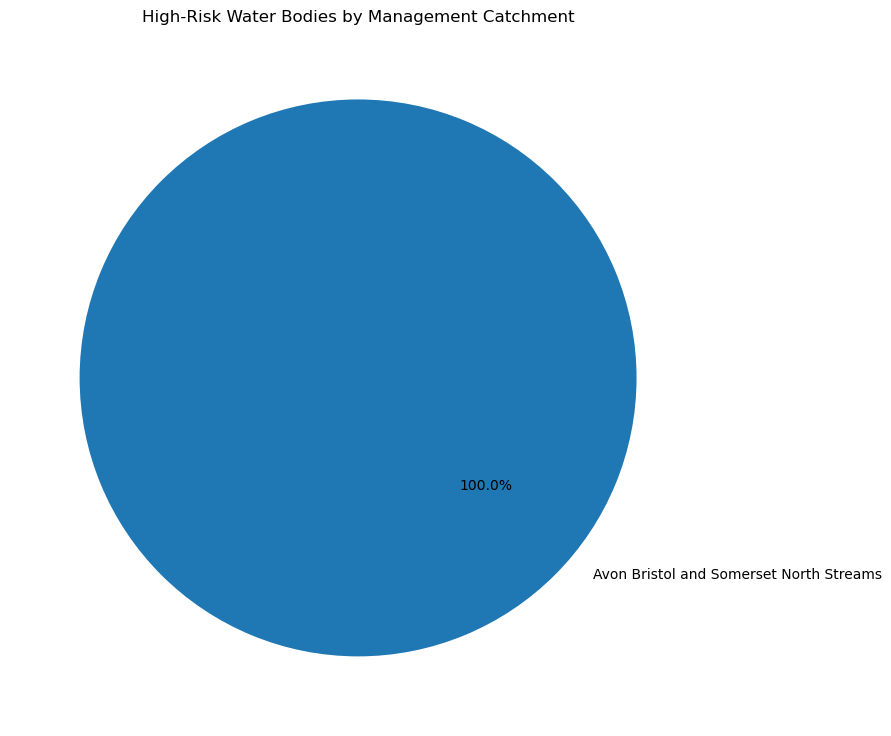

In [283]:
# Count by Management Catchment
catchment_counts = high_risk['Management Catchment'].value_counts()

# Plot
plt.figure(figsize=(9, 9))
catchment_counts.plot(
    kind='pie',
    autopct='%1.1f%%',
    startangle=140,
    color=plt.cm.Greens(range(len(catchment_counts)))
)
plt.title('High-Risk Water Bodies by Management Catchment')
plt.ylabel('')
plt.tight_layout()
plt.show()